SAMARTH MOTKA

---


202311023


---


DIP_LAB_3

#Task 1
##Load and Display Image-Write a Python script that loads a color image from a file, displays it in original image , gray scale image and binary image, and saves the displayed image as a new file. Use the OpenCV library for image processing.

In [179]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
img = cv2.imread('/content/drive/MyDrive/Daiict/sem2/DIP/lab_3/321688770_911012946937667_1376643055033402415_n.webp')



def display(img):
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_bin = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  _, binary_image = cv2.threshold(img_bin, 127, 255, cv2.THRESH_BINARY)

  plt.figure(figsize=(8, 6))

  plt.subplot(2, 2, 1)
  plt.imshow(img_rgb)
  plt.title('Original Image')

  plt.subplot(2, 2, 2)
  plt.imshow(img_grey,cmap='gray')
  plt.title('Grayscale Image')

  plt.subplot(2, 2, 3)
  plt.imshow(binary_image,cmap='gray')
  plt.title('Binanry Image')

  # plt.subplots_adjust(hspace=0.5)

  plt.show()

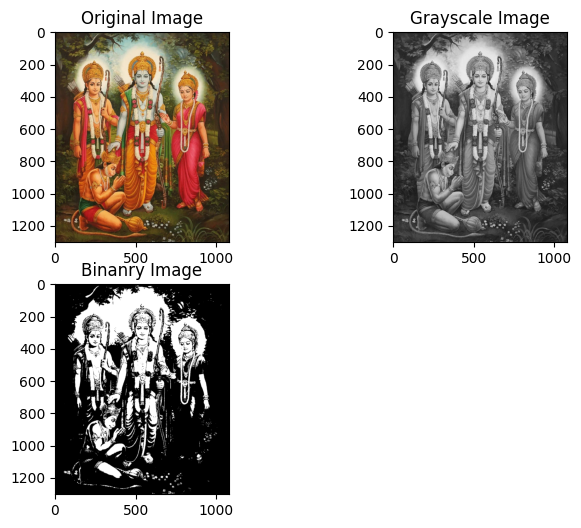

In [180]:
display(img)

# **Task 2**
## Visualize R, G, B Channels - Separate the loaded color image into its Red, Green, and Blue channels. Visualize each channel separately and discuss the differences observed in each channel.

In [161]:
from skimage import io, color


def rgb_color(image):
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    b,g,r = cv2.split(img_rgb)

    zeros = np.zeros_like(g)
    red_image = cv2.merge([zeros, zeros, r])
    green_image = cv2.merge([zeros, g, zeros])
    blue_image = cv2.merge([b, zeros, zeros])

    color = [red_image,green_image,blue_image]

    for i in color:
      plt.figure(figsize=(8, 4))
      plt.subplot(1, 2, 1)
      plt.imshow(img_rgb,cmap='gray')
      plt.title('Original Image')

      plt.subplot(1, 2, 2)
      plt.imshow(i)
      plt.title('Reconstructed Image')

      plt.show()

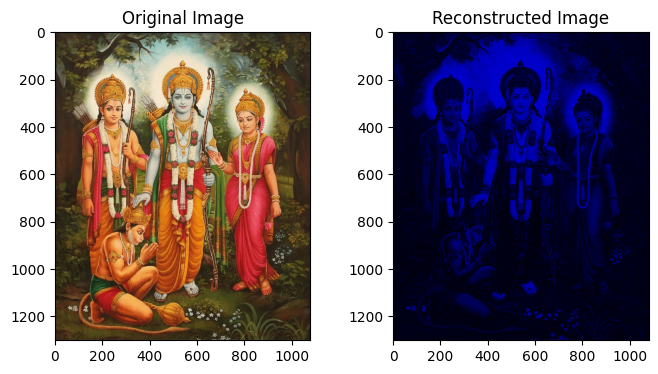

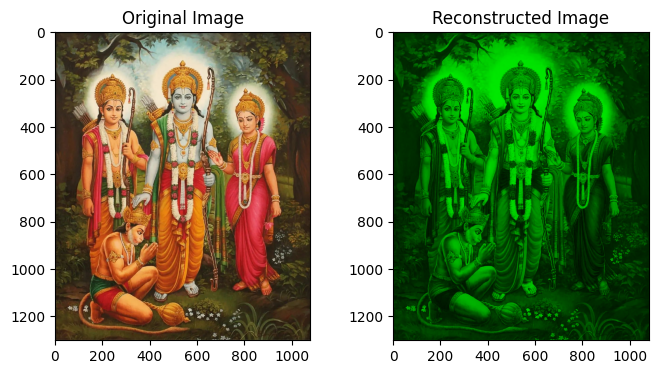

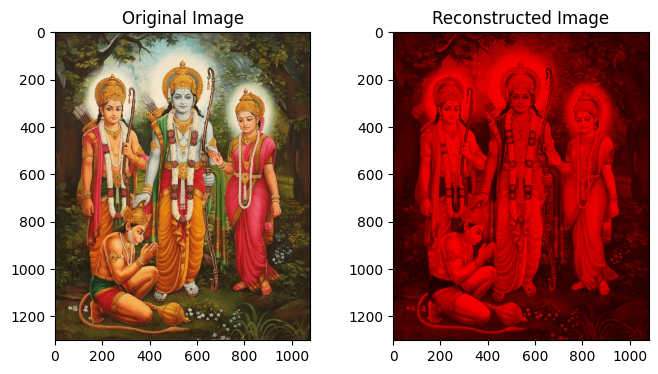

In [162]:
rgb_color(img)

#Task 3
##Enhance Contrast - Apply contrast enhancement to the grayscale image using histogram equalization. Display the original grayscale image and the enhanced grayscale image.

In [163]:
def enhanceConstrat(image):
  img_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
  enhanced = clahe.apply(img_grey)

  plt.figure(figsize=(10, 6))
  plt.subplot(1, 2, 1)
  plt.imshow(img_grey,cmap='gray')
  plt.title('Original Image')

  plt.subplot(1, 2, 2)
  plt.imshow(enhanced,cmap='gray')
  plt.title('Enhanced Contrast Image)')
  plt.show()

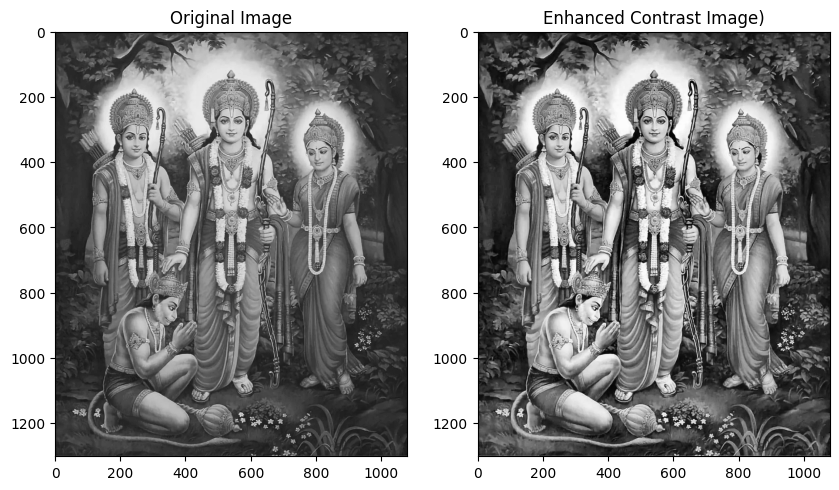

In [164]:
enhanceConstrat(img)


#Task 4
##Enhance Contrast with different methods - Histogram Equalization, CLAHE(Contrast Limited Adaptive Histogram Equalization), and Gamma Correction.

In [165]:
def adjust_gamma(image, gamma=1.0):

	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	return cv2.LUT(image, table)


def enhanceConstratdiff(image,x,y):
  img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  img_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  hist_eql = cv2.equalizeHist(img_grey)

  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
  enhancedclahe = clahe.apply(img_grey)

  gamma1 = adjust_gamma(img_rgb,x)
  gamma2 = adjust_gamma(img_rgb,y)

  plt.figure(figsize=(15, 8))

  plt.subplot(1,5,1)
  plt.imshow(img_rgb)
  plt.title('Original Image')

  plt.subplot(1,5,2)
  plt.imshow(hist_eql,cmap='gray')
  plt.title('Histogram Equalization')

  plt.subplot(1,5,3)
  plt.imshow(enhancedclahe,cmap='gray')
  plt.title('CLAHE')

  plt.subplot(1,5,4)
  plt.imshow(gamma1,cmap='gray')
  plt.title('Gamma correction , 0.5')

  plt.subplot(1,5,5)
  plt.imshow(gamma2,cmap='gray')
  plt.title('Gamma correction , 1.0')


  plt.show()

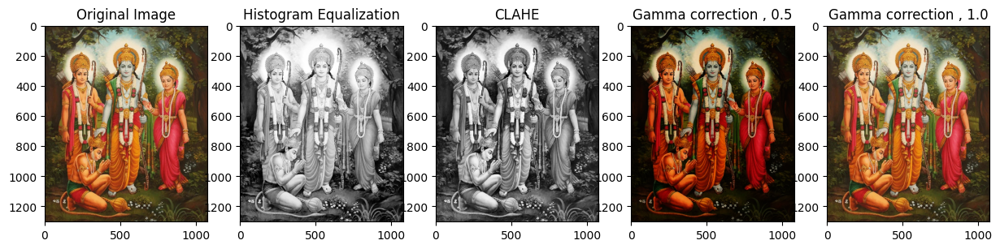

In [166]:
enhanceConstratdiff(img,0.5,1)

#Task 5
## Color Complement - Implement a function to obtain the color complement of the original color image. Display the original and the color complement images side by side.

In [167]:
def complement(image):
  img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  comp_img = 255 - img_rgb

  plt.figure(figsize=(10, 6))
  plt.subplot(1,2,1)
  plt.imshow(img_rgb)
  plt.title('Original Image')

  plt.subplot(1,2,2)
  plt.imshow(comp_img)
  plt.title('Complemented Image')

  plt.show()



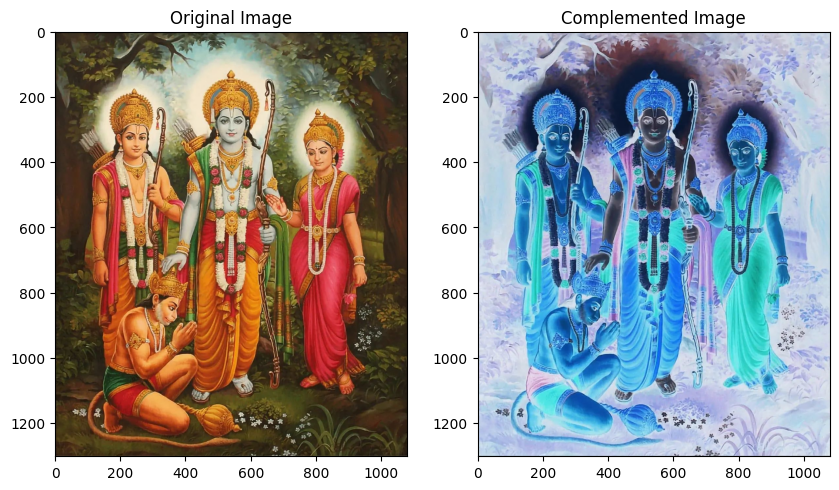

In [168]:
complement(img)

#Task 6
## Hue, Saturation, Intensity (HSI) - Convert the original color image to the HSI color space. Visualize and discuss the changes in the Hue, Saturation, and Intensity components.

In [169]:
def HSI(image):

    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGBA)
    img_hsi = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    hue_channel = img_hsi[:, :, 0]
    saturation_channel = img_hsi[:, :, 1]
    intensity_channel = img_hsi[:, :, 2]

    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(img_rgb)
    plt.title('Original Image')

    plt.subplot(2, 2, 2)
    plt.imshow(hue_channel, cmap='hsv')
    plt.title('Hue Component')

    plt.subplot(2, 2, 3)
    plt.imshow(saturation_channel, cmap='gray')
    plt.title('Saturation Component')

    plt.subplot(2, 2, 4)
    plt.imshow(intensity_channel, cmap='gray')
    plt.title('Intensity Component')

    plt.tight_layout()
    plt.show()


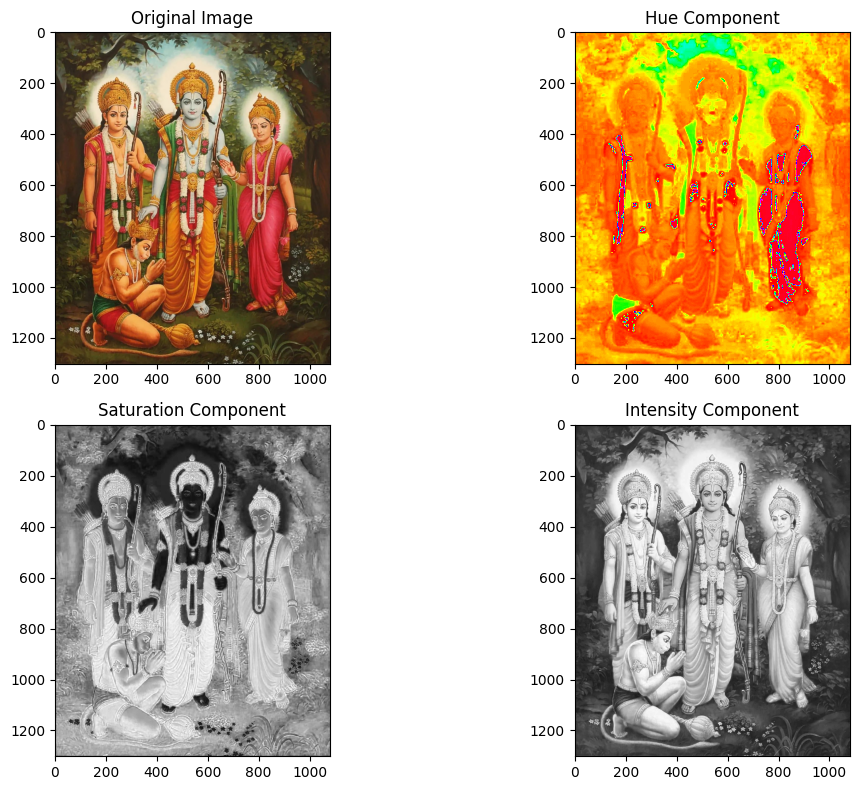

In [170]:
HSI(img)

#Task 7
##Chromaticity Diagram - Create a chromaticity diagram by plotting the normalized R, G, and B values for each pixel in the color image. Discuss the distribution of colors on the diagram.

In [171]:
import seaborn as sns

def ChromaticityDiagram(image):

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_norm = img.astype(np.float32) / (np.sum(img, axis=2, keepdims=True) + 1e-10)

    r_channel = img_norm[:, :, 0]
    g_channel = img_norm[:, :, 1]
    b_channel = img_norm[:, :, 2]


    plt.figure(figsize=(8, 8))
    plt.scatter(r_channel.flatten(), g_channel.flatten(), c=img_rgb.reshape((-1, 3))/255.0, s=1, marker='.')
    plt.title('Chromaticity Diagram')
    plt.xlabel('Normalized Red Channel')
    plt.ylabel('Normalized Green Channel')
    plt.grid(True)
    plt.show()

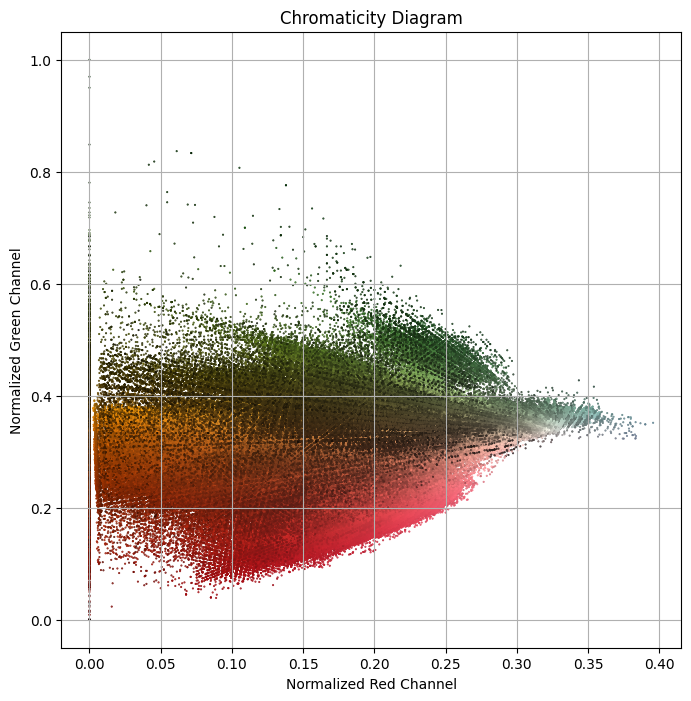

In [172]:
ChromaticityDiagram(img)

As seen from above diagram we see the image is mostly comprised of Red,Green and bit of light blue color which further makes other color by combining it.

#Task 8
## Color Slicing - Implement a color slicing operation that highlights a specific color (Ex. Yellow color, RED color) range in the image. Choose a color range and display the original image alongside the result of color slicing.

In [173]:
def colorSlicing(img, color_lower, color_upper):

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    lower_bound = np.array(color_lower, dtype=np.uint8)
    upper_bound = np.array(color_upper, dtype=np.uint8)

    color_mask = cv2.inRange(img_hsv, lower_bound, upper_bound)

    result_image = cv2.bitwise_and(img_rgb, img_rgb, mask=color_mask)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(result_image)
    plt.title('Color Sliced Image')

    plt.show()

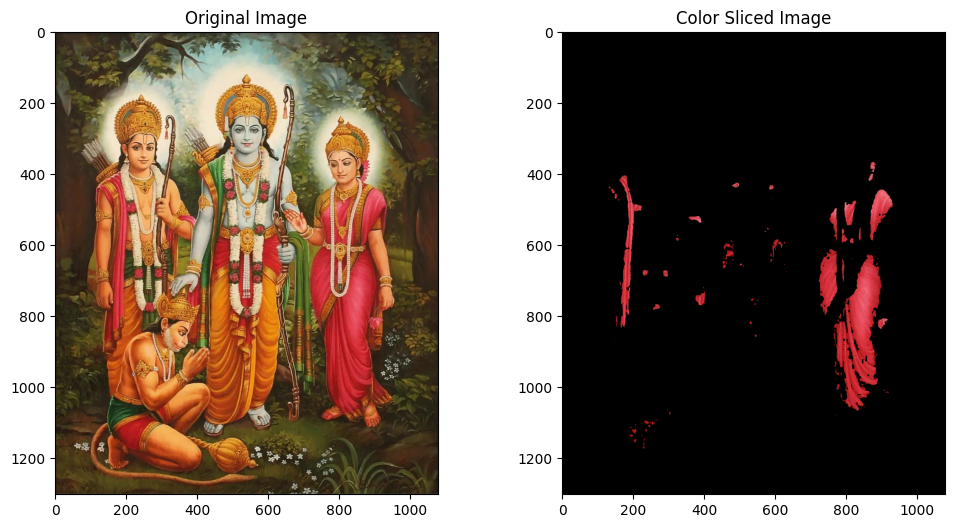

In [174]:
red_lower = [100, 100, 0]
red_upper = [255, 255, 255]

colorSlicing(img, red_lower, red_upper)

#Task 9
##Pseudo-Coloring - Apply a pseudo-coloring technique to the grayscale image. Discuss the choice of color map and the impact on the visual perception of the image. color_maps = [ 'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'cool', 'spring', 'summer', 'autumn', 'winter' ]

In [175]:
import cv2
import matplotlib.pyplot as plt

def PseudoColoring(img, colormap):

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    colored_image = cv2.applyColorMap(img_gray, colormap)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title('Original Grayscale Image')

    plt.subplot(1, 2, 2)
    plt.imshow(colored_image)
    plt.title(f'Pseudo-Colored Image - Colormap: {colormap}')

    plt.show()

The choice of a colormap can have a profound impact on the visual perception of an image. Different colormaps emphasize different aspects of the data, and the choice should be made considering the specific characteristics you want to highlight.

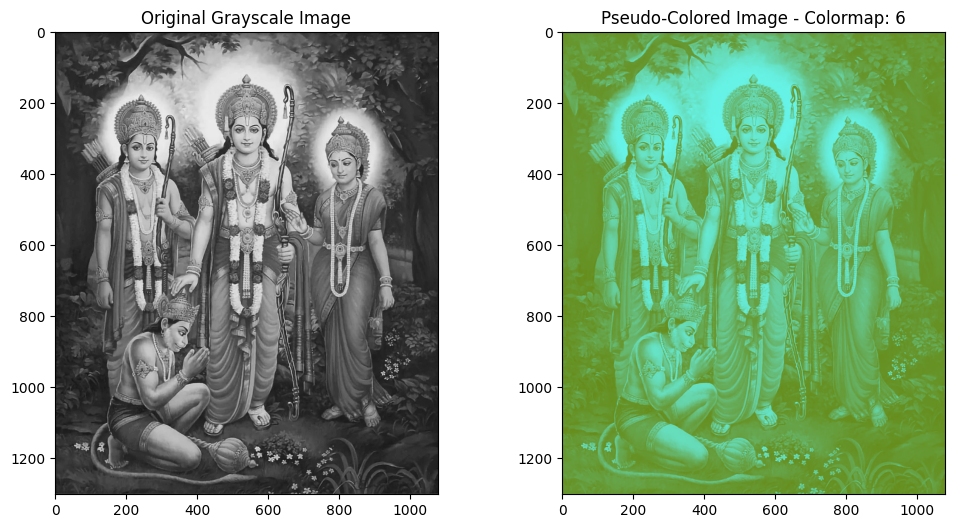

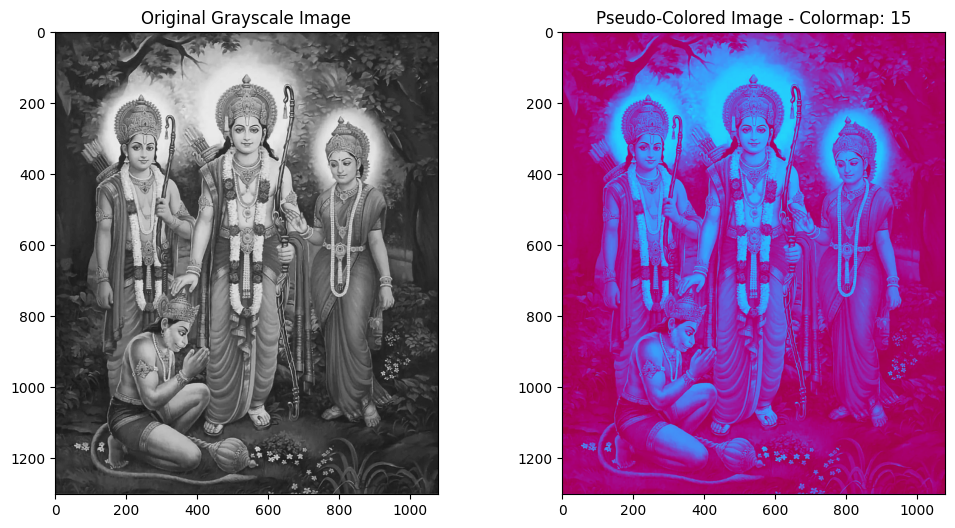

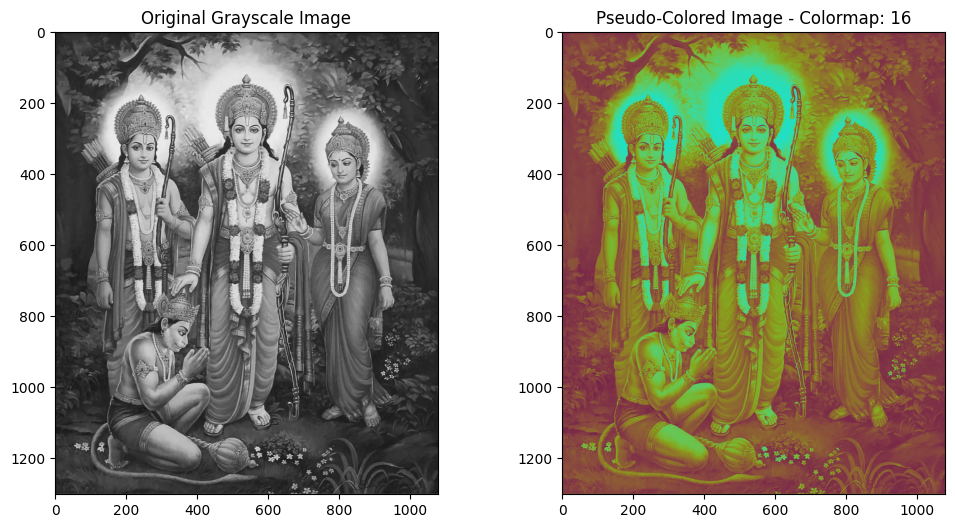

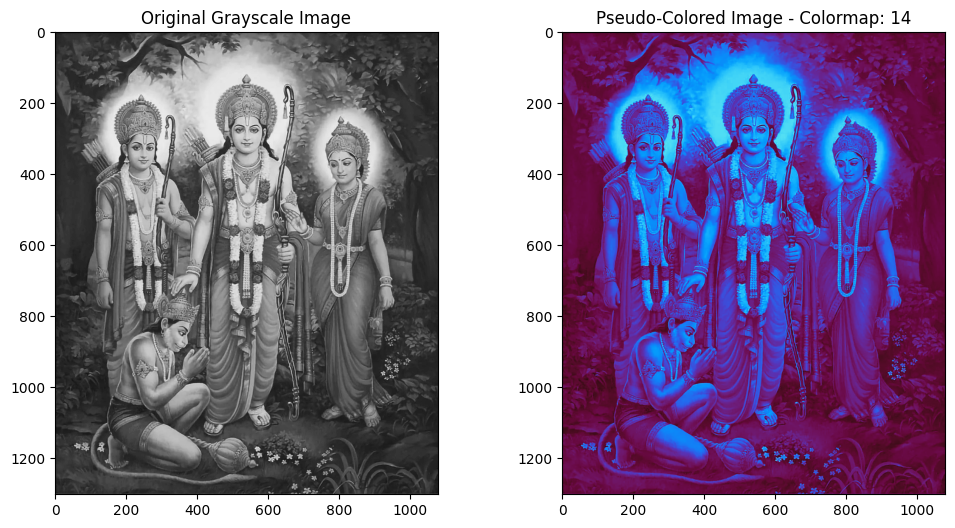

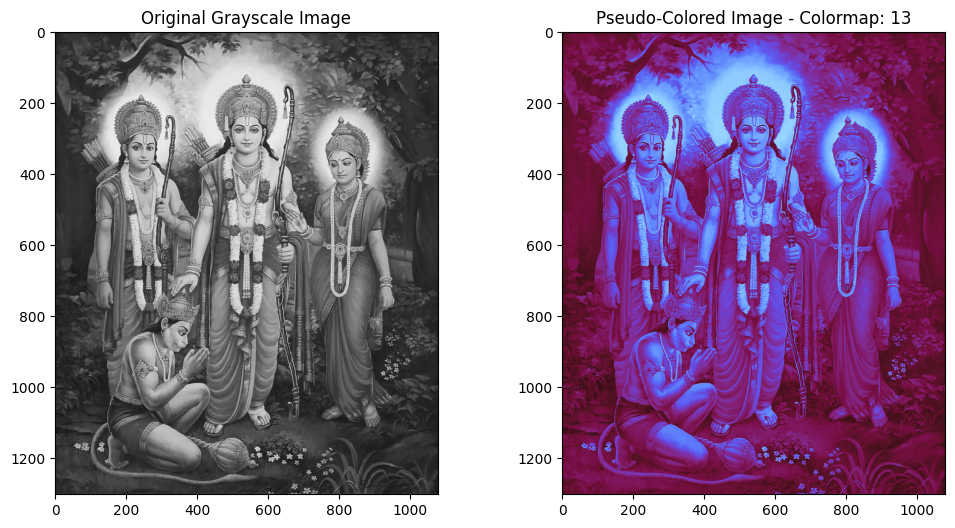

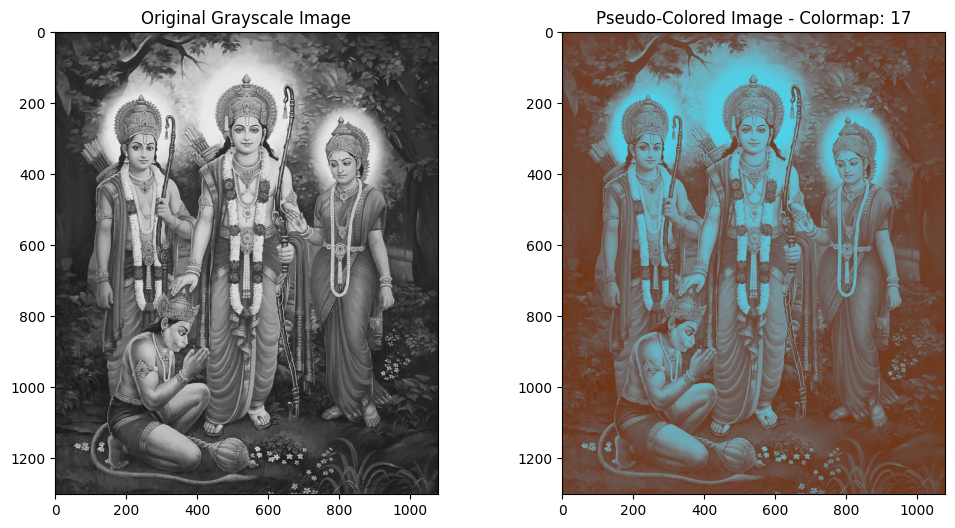

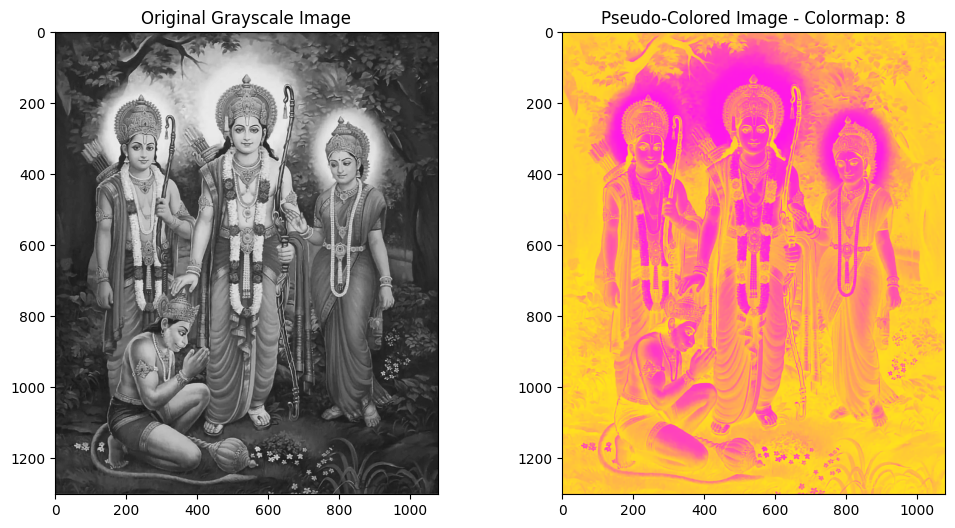

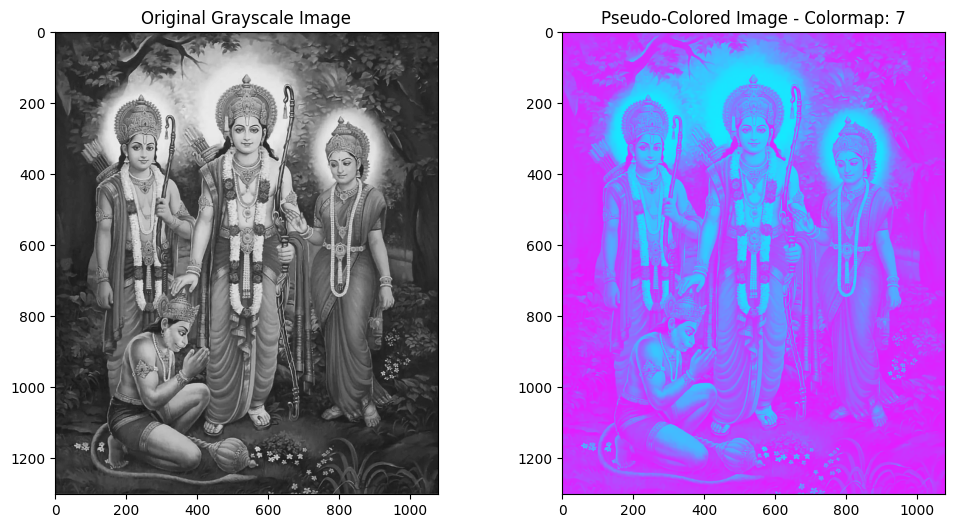

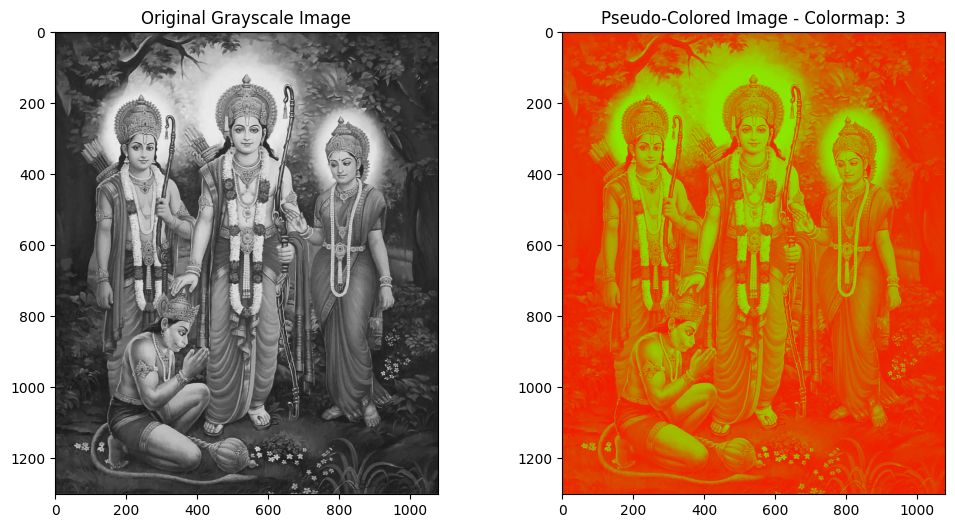

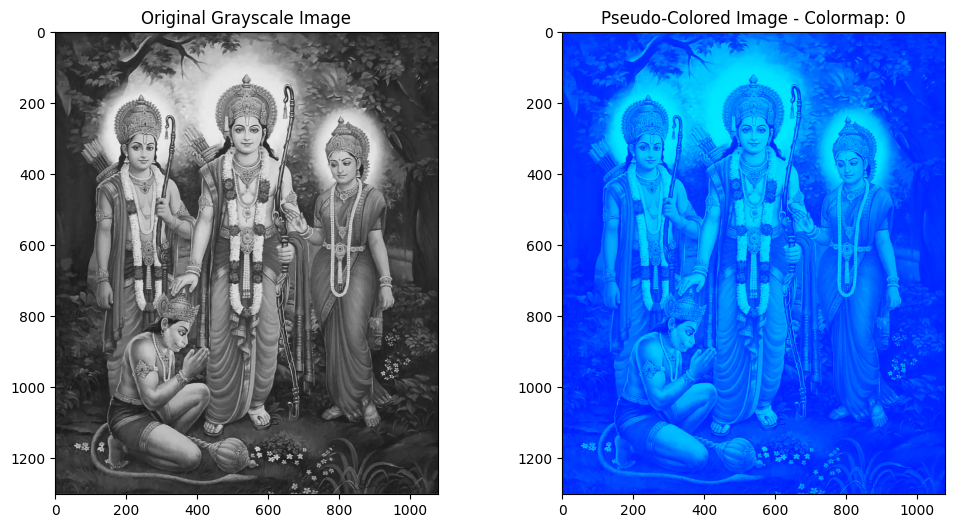

In [176]:

l=[6,15,16,14,13,17,8,7,3,0]
color_map = cv2.COLORMAP_VIRIDIS
for i in l:
  PseudoColoring(img, i)

#Task 10
## Intensity Scaling - Perform intensity scaling on the original grayscale image to adjust the brightness and contrast. Display the original and scaled images for comparison.

In [177]:
def intensityScaling(img, alpha, beta):


    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    scaled_image = cv2.convertScaleAbs(img_gray, alpha=alpha, beta=beta)

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title('Original Grayscale Image')

    plt.subplot(1, 2, 2)
    plt.imshow(scaled_image, cmap='gray')
    plt.title(f'Scaled Image - Alpha: {alpha}, Beta: {beta}')

    plt.show()

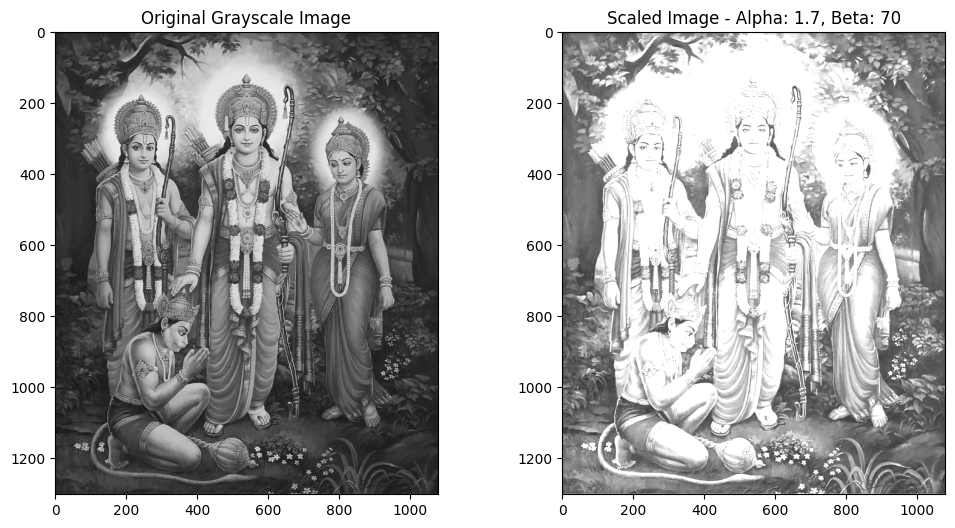

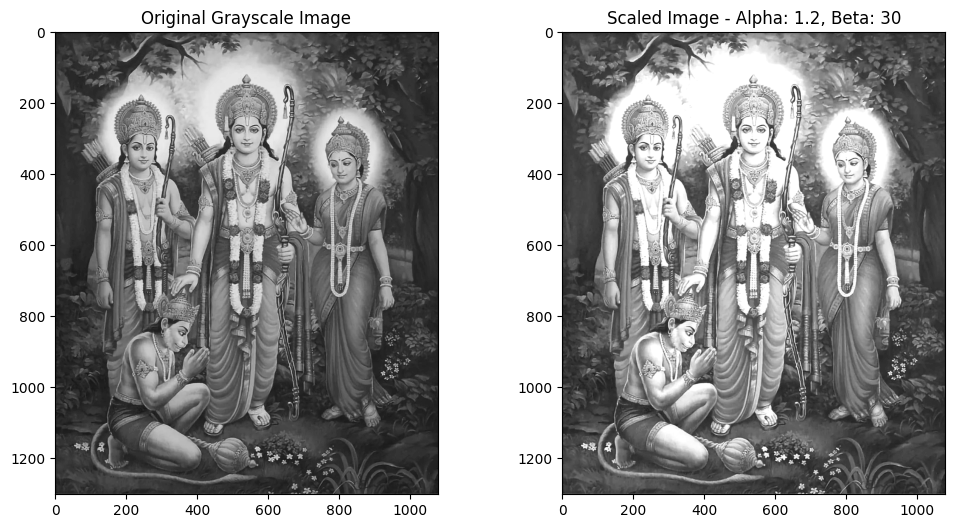

In [178]:
contrast_value = 1.7
brightness_value = 70

intensityScaling(img, contrast_value, brightness_value)

contrast_value = 1.2
brightness_value = 30

intensityScaling(img, contrast_value, brightness_value)